# End-to-end Dog Breed Classification

This notebook builds an end-to-end multi-class image classifer using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

> Identify the breed of a dog, given an image of a dog.

## 2. Data

The data used is from Kaggle's Dog Breed Identification competition: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

Calculate the multi-class log loss; a vector of probabilities for each of the 120 dog breeds. For more information, see here: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

* We are dealing with images (unstructured data), therefore we use deep learning/transfer learning.
* There are 120 breeds of dogs, hence 120 different classes.
* There are around 10,000+ images in the training set (with labels).
* There are around 10,000+ images in the test set.

In [4]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check if GPU is available
print("GPU", "available" if tf.test.gpu_device_name() else "not available")

TF version: 2.5.0
TF Hub version: 0.12.0
GPU available


## Turn the data into tensors

With all machine learning models, our data has to be in numerical format. We will turn our images into tensors.

Let's begin by accessing our data and checking out the labels.

In [5]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9aa1487dc5bbb2c34758d1a608f09bef  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


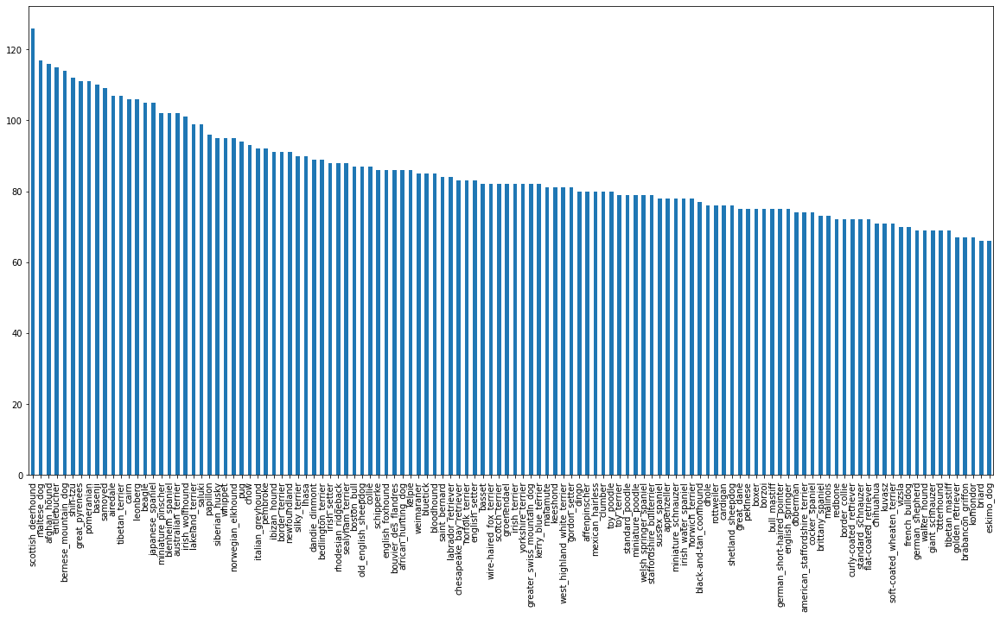

In [ ]:
# Let's look at the distribution of breeds in the label data.
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10)) 

In [ ]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

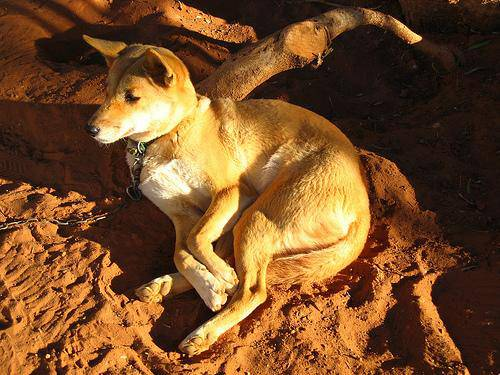

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Read in images and their labels

Let's read a list of all of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [45]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [46]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual number of files! Proceed with model!")
else:
  print("Filenames do not match actual number of files! Check target directory.")

Filenames match actual number of files! Proceed with model!


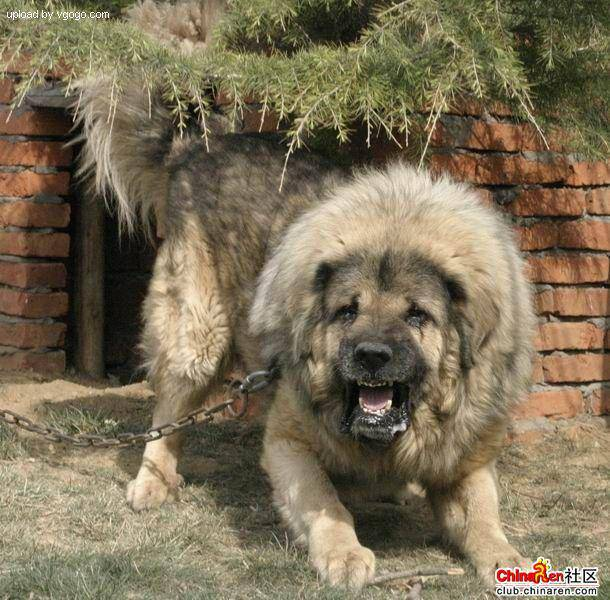

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
# Check this dog's breed
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now read our training image filepaths in a list, let's prepare our labels.

In [23]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels and filenames match! Keep going!")
else:
  print("Number of labels and filenames do not match! Check data directories!") 

Number of labels and filenames match! Keep going!


In [24]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set
Since the dataset from Kaggle doesn't come with a validation set, we will create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We start off experimenting with ~1000 images and will increase as needed.

In [ ]:
# Set number of images to use for experimenting 
# Hyperparameters are often in all caps
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:10}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a peek at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing images (turning images into tensors)

To preprocess our images into tensors, we will write a function which:
1. Take an image filepath as input
2. Use `TensorFlow` to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert color channel values from [0, 255] to [0,1].
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [47]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
# Read in image as a tensor via TensorFlow
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now that we've seen what an image looks as a tensor, let's make a function to preprocess them. 

In [18]:
# Define image size
IMG_SIZE = 224 # This is the size required by the model we are choosing

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor
  """
  # Read in an image file via TensorFlow
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 color channels.
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turn our data into batches

Why turn our data into batches?

Suppose we try to process 10,000 images in one go, they might not all fit into memory; the GPU has a limited amount of memory! That's why we will do about 32 (batch size) images at a time, according to Yann LeCun.

In order to use tensorFlow effectively, we need our data in the form of Tensor tuples which look like: `(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label.
   Processes this image and returns a tupe of (image, label).
  """
  image = process_image(image_path)
  return image, label

Now that we've got a way to turn our data into tuples of tensors in the form `(image, label)`, let's make a function to turn all of our data (`X` and `y`) into batches.

In [15]:
# Define the batch size; 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, 
                        test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  It shuffles the data if it is training data, but doesn't shuffle if it's 
  validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we do not have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Filepaths only
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a training dataset, we need to shuffle it
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling the pathnames and labels before mapping image processor 
    # function is faster!
    data = data.shuffle(buffer_size=len(X)) # Shuffle the entirety of X

    # Create (image, label) tuples (this also turns the image path into a
    # preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch        

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the differnet attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however to develop some intuition as to what is going on, we visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 images
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

In [ ]:
# Return numpy arrays from the tensor data batches
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.6872287 , 0.72644436, 0.83232677],
          [0.6872287 , 0.72644436, 0.83232677],
          [0.6872287 , 0.72644436, 0.83232677],
          ...,
          [0.36862746, 0.5411765 , 0.7803922 ],
          [0.36018905, 0.5405812 , 0.7719538 ],
          [0.35143554, 0.5318277 , 0.7632003 ]],
 
         [[0.6930585 , 0.7322742 , 0.8381566 ],
          [0.6930585 , 0.7322742 , 0.8381566 ],
          [0.6930585 , 0.7322742 , 0.8381566 ],
          ...,
          [0.36862746, 0.5411765 , 0.7803922 ],
          [0.36305144, 0.5434436 , 0.7748162 ],
          [0.35429794, 0.5346901 , 0.7660627 ]],
 
         [[0.6997374 , 0.7389531 , 0.8448355 ],
          [0.6997374 , 0.7389531 , 0.8448355 ],
          [0.6997374 , 0.7389531 , 0.8448355 ],
          ...,
          [0.3697234 , 0.5422725 , 0.78148824],
          [0.3642395 , 0.54463166, 0.77600425],
          [0.3562062 , 0.5365983 , 0.7679709 ]],
 
         ...,
 
         [[0.4068324 , 0.438859  , 0.29689276],
          [0.28742

In [ ]:
# This should return BATCH_SIZE
len(train_images), len(train_labels)

(32, 32)

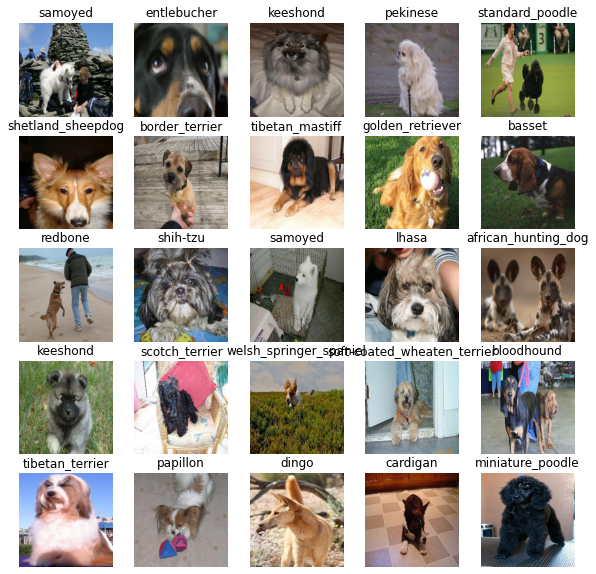

In [ ]:
# Note that different images show on each run because, in the batch function,
# the shuffle function is mapped.
show_25_images(train_images, train_labels)

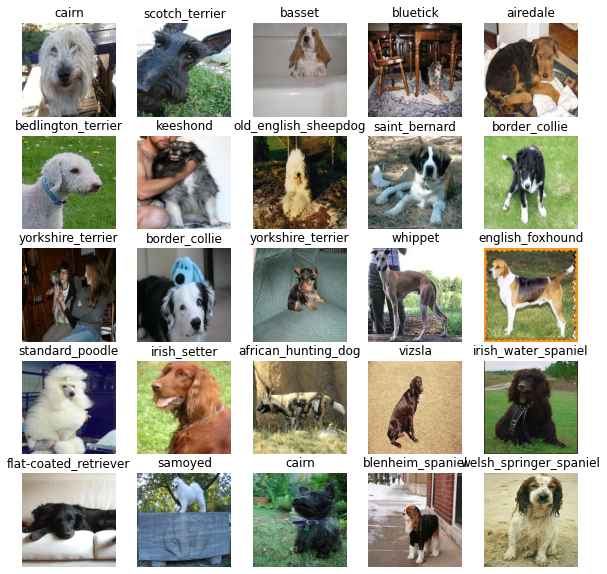

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, we must define a few objects:
* The `input` shape (our image shape, in the form of tensors) to our model.
* The `output` shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use (via TensorFlow Hub): https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, RGB channel

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now that we've got our inputs, outputs, and model ready to go, let's put them together into a Keras deep learning model!

We create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then that, etc.)
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll receive)
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                 activation="softmax") # Layer 2 (output layer) for the number of breeds.
                                       # Use Softmax for mutli-class, sigmoid for binary class.
      ])
  
  # Compile the model (how does it minimize loss while learning?)
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), 
      # Optimal for multi-classifcation, choose BinaryCrossentropy for 
      # binary classification problems.
      optimizer=tf.keras.optimizers.Adam(), # This is generally good optimizer
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during tarining to do such things as saving its progress, checking its progress, or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard, which helps track our models progress, and another for early stopping, which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime # Need this to access current date/time

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run 
                        # an experiment.
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping stops our model from overfitting by halting training when a certain evaluation metric stops improving: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to be trained on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns a trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # This is measured per epoch
            callbacks=[tensorboard, early_stopping])
  
  # Returns the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 165s 5s/step - loss: 4.5133 - accuracy: 0.1037 - val_loss: 3.4242 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 120ms/step - loss: 1.6068 - accuracy: 0.6950 - val_loss: 2.2109 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5648 - accuracy: 0.9325 - val_loss: 1.7039 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 3s 117ms/step - loss: 0.2491 - accuracy: 0.9862 - val_loss: 1.5309 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 3s 115ms/step - loss: 0.1440 - accuracy: 0.9962 - val_loss: 1.4570 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.0991 - accuracy: 1.0000 - val_loss: 1.4004 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

It appears that our model is overfitting because it is performing far better on the training dataset than the validation dataset! This is not too bad for a first model!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualizeits contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs # The forward slash is for the space between words

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)

# This gives the probability for every single label for each image
predictions

7/7 [==============================] - 1s 91ms/step


array([[7.5323763e-04, 4.2393585e-05, 3.5237495e-04, ..., 9.5669128e-04,
        1.1230547e-05, 4.5724269e-03],
       [9.6424966e-04, 9.1491640e-04, 3.8491366e-03, ..., 9.0470584e-04,
        3.7039348e-03, 2.8813499e-04],
       [5.8798031e-07, 5.5269105e-05, 8.1710059e-06, ..., 1.0750771e-05,
        1.0984747e-05, 2.6903997e-05],
       ...,
       [1.2558390e-05, 2.5024170e-05, 5.6958740e-04, ..., 2.6121765e-05,
        2.4009025e-05, 3.0132589e-05],
       [1.3998522e-03, 1.4983937e-04, 1.5718344e-04, ..., 1.3380247e-04,
        3.6124860e-05, 1.0774519e-02],
       [1.2127430e-03, 8.1598728e-06, 5.4640579e-03, ..., 3.8732940e-03,
        7.6291390e-04, 7.1509719e-05]], dtype=float32)

In [ ]:
# These probabilities for a single image should add up to 1 thanks
# to the 'softmax' activation function specified in the dense layer.
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 4
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.04966056e-06 4.47549564e-06 8.44419787e-07 9.92451847e-01
 2.01624857e-06 6.10091229e-06 1.34816410e-05 6.09008248e-06
 3.15192592e-05 9.80870595e-07 2.13030507e-05 1.70627682e-05
 3.56720848e-05 1.15196360e-06 8.57587438e-05 2.97848692e-06
 2.88130354e-06 1.22135607e-04 4.29530837e-06 1.75834742e-07
 4.45230307e-06 1.87491523e-07 3.51254539e-06 7.18820593e-06
 1.73608225e-06 9.61618184e-07 4.07694820e-08 4.53752193e-07
 3.65837826e-04 6.98687543e-08 1.47497542e-06 7.78716128e-07
 2.20947527e-06 2.66634356e-06 3.05374078e-06 7.82884456e-07
 3.20856416e-05 3.43953652e-05 1.23040229e-06 3.42339699e-05
 3.06112088e-06 8.78132084e-07 7.14422140e-06 1.13959663e-06
 7.84326119e-07 3.92492495e-07 2.40814843e-05 1.67907456e-06
 4.39348014e-06 2.51763831e-05 7.91153889e-06 7.17272925e-08
 5.24424195e-07 9.61719934e-07 6.72904389e-06 4.21277164e-08
 4.50531188e-05 1.42204037e-04 2.48261222e-06 3.98510310e-05
 8.35685000e-07 1.05561833e-06 3.17968954e-07 4.46919194e-06
 1.37023130e-06 2.226827

Having the above functionality, but we want to do it for multiple predictions. It would be even better if we could see the image of which the prediction is being made.

**Prediction probabilities are also know as confidence levels in the literature.**

In [14]:
# Turn probabilities into their respective labels.
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a dog breed label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Return a predicted label based on an array of prediction probabilities.
pred_label = get_pred_label(predictions[0])
pred_label

NameError: ignored

Our validation data is in a batch, we will unbatch it to make predictions on the validation images and then compare those predictions to the validation labels.

In [13]:
# Create a function to unbatch a batch dataset

def unbatchify(batched_data):
  """
  Takes a batched dataset of (image, label) tensors and returns separate 
  numpy arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in batched_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

Now we've found ways to obtain:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's create a function to visualize these items.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted labe, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or
  # wrong.
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction, and truth
  plt.title("{}, {:2.0f}%, {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
            color=color)

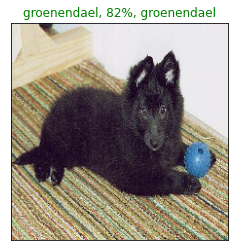

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model's top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an `input` of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indices
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [12]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for
  sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Obtain the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

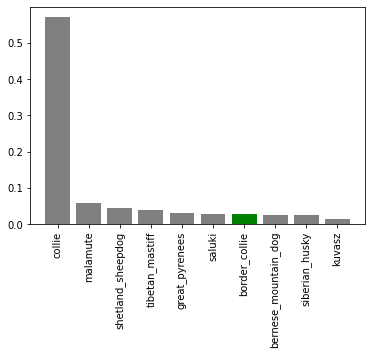

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

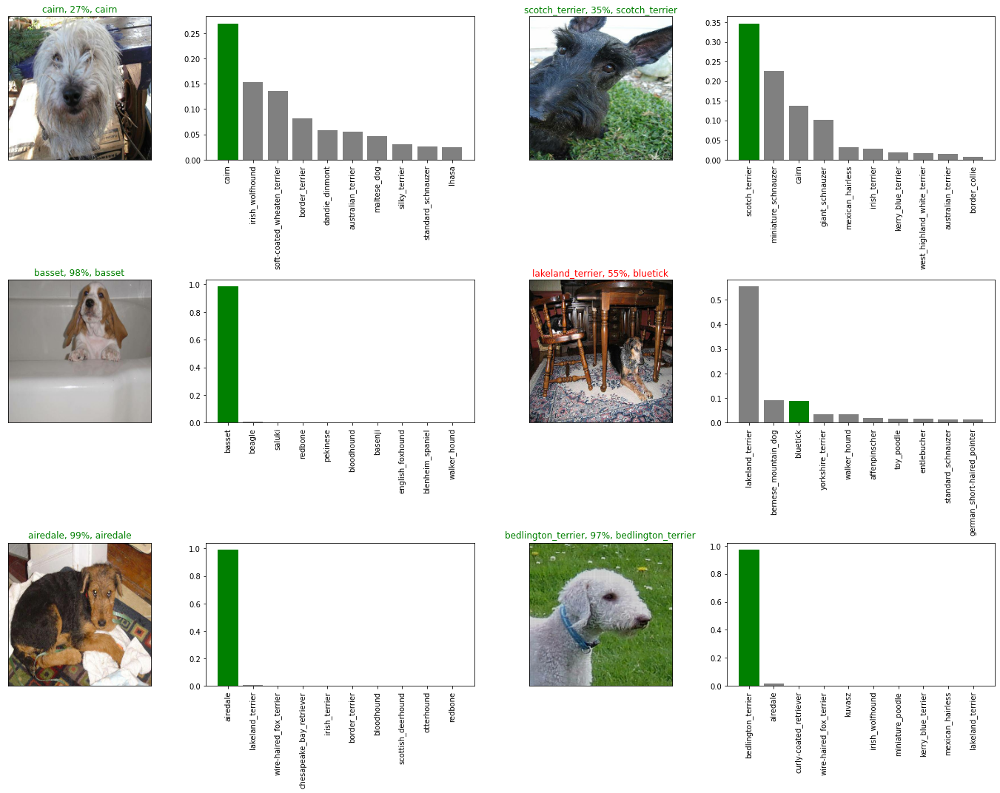

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge**: How would you create a confusion matrix with our model predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir =os.path.join("drive/My Drive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save file format of TensorFlow
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [9]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20210707-08221625646160-1000-images-Adam.h5...


'drive/My Drive/Dog Vision/models/20210707-08221625646160-1000-images-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20210707-08221625646160-1000-images-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210707-08221625646160-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.2551 - accuracy: 0.6600


[1.2551401853561401, 0.6600000262260437]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.2551 - accuracy: 0.6600


[1.2551401853561401, 0.6600000262260437]

## Training model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training all the data, so we can't monitor validation
# accuracy.
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note**: Running the cell below will take some time! (possibly 30 minutes for the first epoch!)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1385s 4s/step - loss: 1.3362 - accuracy: 0.6676
Epoch 2/100
320/320 [==============================] - 30s 92ms/step - loss: 0.3998 - accuracy: 0.8845
Epoch 3/100
320/320 [==============================] - 30s 92ms/step - loss: 0.2363 - accuracy: 0.9330
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1558 - accuracy: 0.9610
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1055 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0775 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0590 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0467 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0377 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 30s 92ms/step - l

In [ ]:
# Save the full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20210707-09021625648555-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20210707-09021625648555-full-image-set-mobilenetv2-Adam.h5'

In [10]:
# Load the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210707-09021625648555-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210707-09021625648555-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on our test images, we'll have to convert it into the same format.

Luckily, we created `create_data_batches()` earlier, which can take a list of filenames as `input` and convert them into tensor batches.

To make predictions on the test data, we'll: 
* Take the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data does not have labels).
* Make a predictions array by passing the test batches to the `predict()` called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/dccf2e91f79396055e7ff83f1f207fbc.jpg',
 'drive/My Drive/Dog Vision/test/e16c4485a37ac90e1623e2da77513648.jpg',
 'drive/My Drive/Dog Vision/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 'drive/My Drive/Dog Vision/test/dda9df5ec2de82082127c99052fd077b.jpg',
 'drive/My Drive/Dog Vision/test/dcccc266ef919edbf3416078edc849db.jpg',
 'drive/My Drive/Dog Vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/My Drive/Dog Vision/test/e08d42b2e6f2dbcf24c6bfee8b7d03bd.jpg',
 'drive/My Drive/Dog Vision/test/e2976affb6d88a3e627ff8c31844f20a.jpg',
 'drive/My Drive/Dog Vision/test/e644a1f6f9c69ee8f7e8d834730bbfd7.jpg',
 'drive/My Drive/Dog Vision/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note**: Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1471s 5s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.77775021e-07, 9.28055272e-11, 7.41097635e-12, ...,
        6.71681821e-10, 2.91154635e-07, 8.66634764e-07],
       [2.58855586e-08, 1.94998293e-08, 6.10263839e-10, ...,
        3.24191873e-08, 1.81681898e-07, 3.47539890e-06],
       [9.16236809e-11, 7.33725494e-12, 3.21190882e-12, ...,
        4.49370272e-12, 4.43412971e-12, 6.87972665e-11],
       ...,
       [3.13921977e-09, 1.53649571e-09, 6.88700902e-11, ...,
        1.81577235e-07, 4.90796100e-03, 3.33782180e-09],
       [1.79017050e-08, 2.33736586e-09, 1.92626840e-06, ...,
        1.72242801e-06, 3.82854282e-09, 1.39871267e-10],
       [7.33151182e-07, 6.91479818e-10, 6.45066939e-06, ...,
        9.14015248e-03, 2.29994878e-01, 5.82632680e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data into this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
pred_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions/submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll: 
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. Since our custom images will not have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [39]:
# Take custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-custom-images-3/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [40]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [41]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

(4, 120)

In [42]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cardigan', 'great_pyrenees', 'pug', 'bernese_mountain_dog']

In [43]:
# Get custom images (our unbatchify() function won't work because there are no labels!)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

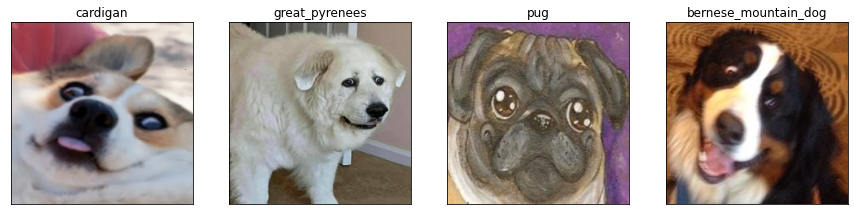

In [48]:
# Check custom image predictions
import matplotlib.pyplot as plt
plt.figure(figsize=(15,15))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [93]:
def subplot_pred_conf(prediction_probabilities, n=1):
  """
  Plot the top 10 highest prediction confidences for sample n in a subplot.
  """
  pred_prob = prediction_probabilities[n]

  # Obtain the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = ax[n,1].bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  ax[n,1].set_xticks(np.arange(len(top_10_pred_values)))
  ax[n,1].set_xticklabels(labels=top_10_pred_labels,
             rotation="vertical")

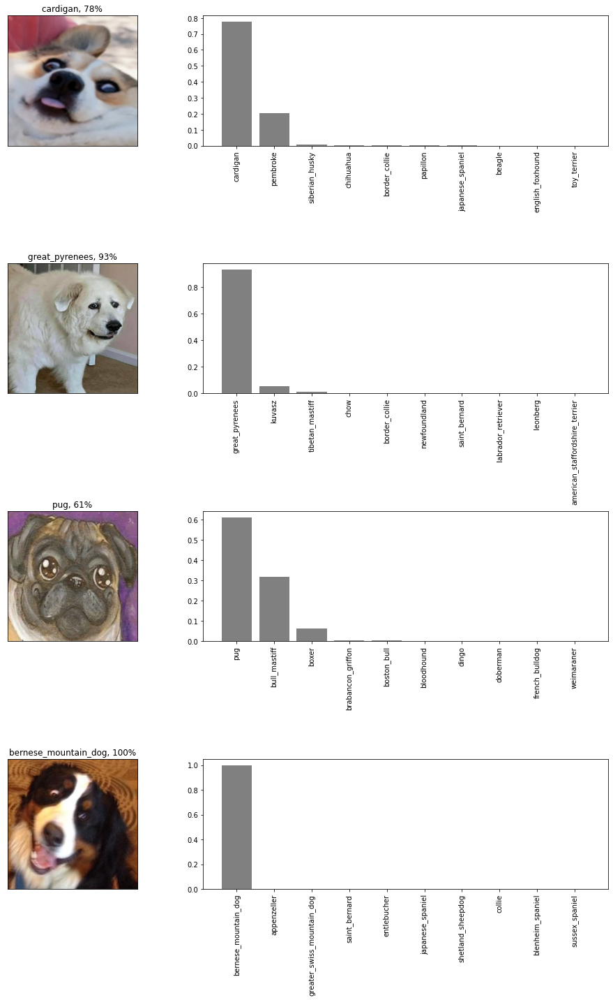

In [97]:
# Let's check out a few predictions and their different values
fig, ax = plt.subplots(len(custom_pred_labels), 2, figsize=(15,20))
for i, image in enumerate(custom_images):
  ax[i, 0].imshow(image, )
  ax[i, 0].set_xticks([])
  ax[i, 0].set_yticks([])
  ax[i, 0].set_title("{}, {:2.0f}%".format(custom_pred_labels[i],np.max(custom_preds[i])*100))
  subplot_pred_conf(prediction_probabilities=custom_preds, n=i)
  plt.tight_layout(h_pad=1)
plt.show()

In [64]:
np.max(custom_preds[0])*100

77.56606936454773